In [1]:
import os

from astropy.visualization import hist
import astropy.io.fits as pyfits
from astropy.io import fits
import astropy.wcs as wcs
from astropy.cosmology import WMAP9 

import numpy as np
import pandas as pd

import scipy.stats as st
from scipy.signal import find_peaks
import scipy.optimize 

# from IPython.core.display import display, HTML

import matplotlib.pyplot as plt
import matplotlib as mpl

import emcee
import corner

from copy import deepcopy

from importlib import reload

import warnings
warnings.filterwarnings("ignore")

**imports functions from user-defined library**

In [7]:
import profiler  

In [8]:
file_names = ['sw004_1', 'sw005_1', 'sw006_1', 'sw006_2', 'sw006_3', 'sw006_4', 'sw008_1', 'sw008_2', 'sw008_3', 'sw009_1']

time = np.zeros(len(file_names))
time_err_lo = np.zeros(len(file_names))
time_err_hi = np.zeros(len(file_names))

for i in range(0, len(file_names)):
    file = 'data/' + file_names[i]+'.evt'
    time_temp, time_err_temp = profiler.time_reader(file)
    time[i] = time_temp[0]
    time_err_lo[i] = time_err_temp[0][0]
    time_err_hi[i] = time_err_temp[0][1]

# DEFINITION OF COMPOSITE MODEL AND LIKELIHOOD FUNCTION 

PSF model: \$f_{\rm PSF}(r) = A \left [W e^{-\frac{r^2}{2 \sigma^2}}+ (1-W) \left( 1+ \left(\frac{r}{r_{\rm c}}\right)^2\right)^{-b}\right] + B\$ 

Lorentzian model: \$f_{\rm L}(r) = \frac{a_{\rm L}}{\pi} \frac{c_{\rm L}}{(r-b_{\rm L})^2+c_{\rm L}^2}\$

Composite model: \$f_{\rm tot}(r) = f_{\rm PSF}(r) + \sum_{i=1}^{n}f_{\rm L_{i}}(r)\$

In [9]:
def model1(params, t):
    A = params[0]
    b = params[-1]
    bg =params[-2] # is the background B in the PSF model
    aL = []
    bL = []
    cL = []
    ring_profile_tot = 0.
    for ind in range(1,len(params)-2,3):
        aL.append(params[ind])
        bL.append(params[ind+1])
        cL.append(params[ind+2])
        ring_profile_tot += profiler.ring_profile(t, aL[-1], bL[-1], cL[-1])
    return profiler.poly(t,params[0],params[-2],params[-1])+ring_profile_tot

def lnlike1(p, t, y, yerr):
    return -0.5 * np.sum(((y - model1(p, t))/yerr) ** 2)
    
def lnprior1(p):
    A = p[0]
    bg = p[-2]
    b = p[-1]
    aL = []
    bL = []
    cL = []    
    
    for ind in range(1,len(p)-2,3):
        aL.append(p[ind])
        bL.append(p[ind+1])
        cL.append(p[ind+2])
        if (A_min<A<A_max and b_min<b<b_max and bg_min<bg<bg_max and aL_min[int(ind/3)] < aL[-1] < aL_max[int(ind/3)] and bL_min[int(ind/3)] < bL[-1] < bL_max[int(ind/3)] and  cL_min[int(ind/3)] < cL[-1] < cL_max[int(ind/3)]):
            pass
        else:
            return -np.inf
    return 0.0

def lnprob1(p, x, y, yerr):
    lp = lnprior1(p)
    return lp + lnlike1(p, x, y, yerr) if np.isfinite(lp) else -np.inf

# Run peak finder for 1st XRT dataset

Analyzing image: split_evt/sw004_1.evt


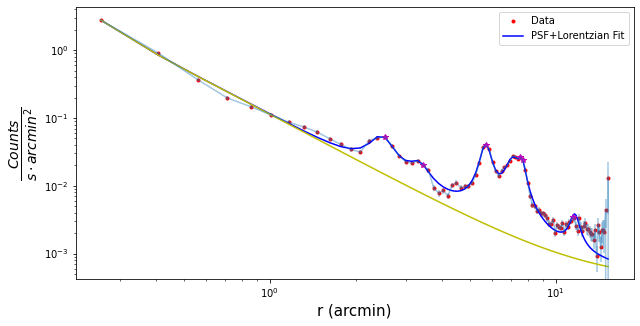

# of peaks: 6.0


In [10]:
iobs = 0
file = 'data/' + file_names[iobs]+'.evt'
file_sky = 'data/' + file_names[iobs]+'_ex.img'
file_ex = 'data/' + file_names[iobs]+'_ex.img'
x_fin, y_fin, y_err_fin, fit_fin, pks_fin = profiler.ring_builder(file_names[iobs], file, file_sky, file_ex)

# Running MCMC on 1st XRT dataset 

In [11]:
flag_chain = 'n' # when 'y' chains are saved in hdf5 files

In [12]:
params_fin=[]

# Data points and errors
t = np.array(x_fin[0][0:])
y = np.array(y_fin[0][0:])
y_err2 = np.array(y_err_fin[0][0:])
yerr = y_err2

for k in range(0,len(y_err2)):
    if yerr[k] == 0. :
        yerr[k] = np.mean(yerr)

data = (t, y, yerr)
peaks=deepcopy(pks_fin[0])

params_cor=np.array(fit_fin[0])

params_names = []
count=1
params_names=["A"]
for k in range(1,len(params_cor)-2,3):
    params_names.append('a_L'+str(count))
    params_names.append('b_L'+str(count))
    params_names.append('c_L'+str(count))
    count += 1
params_names.append("B")
params_names.append("b")
    
aL_min=[]
aL_max=[]
bL_min=[]
bL_max=[]
cL_min=[]
cL_max=[]
     
bg_min=-5. 
bg_max=-2.

A_min=0.8*params_cor[0]
A_max=1.2*params_cor[0]

b_min=0.8*params_cor[-1]
b_max=1.2*params_cor[-1]

percentage_aL_min = 1.   
percentage_aL_max = 1.    

percentage_bL_min = 0.2 
percentage_bL_max = 0.3 

percentage_cL_max = 1. 


for k in range(1,len(params_cor)-2,3):
    aL_min.append(params_cor[k]-percentage_aL_min*params_cor[k])
    aL_max.append(params_cor[k]+percentage_aL_max*params_cor[k])
    bL_min.append(params_cor[k+1]-percentage_bL_min*params_cor[k+1])
    bL_max.append(params_cor[k+1]+percentage_bL_max*params_cor[k+1]) 
    cL_min.append(0.1)
    cL_max.append(params_cor[k+2]+percentage_cL_max*params_cor[k+2])
    
        
nwalkers = 200

initial = np.array(params_cor.tolist())

ndim = len(initial)
p0 = [np.array(initial) + 10**(-2.5) * np.random.randn(ndim)
      for k in range(nwalkers)]

# Set up the backend
# Don't forget to clear it in case the file already exists
if flag_chain == 'y':
    filename = file_names[iobs]+"_chain.h5"
    backend = emcee.backends.HDFBackend(filename)
    backend.reset(nwalkers, ndim)
# Initialize the sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob1, args=data, backend=backend)
else:
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob1, args=data)
    
print("Running burn-in...")
p0, _, _ = sampler.run_mcmc(p0, 500)
sampler.reset()

print("Running production...")
sampler.run_mcmc(p0, 2000)

Running burn-in...
Running production...


State([[ 5.76591580e+01  3.61502868e-02  2.49661747e+00 ...  9.72001315e-01
  -3.01644501e+00  1.11052426e+00]
 [ 5.67435220e+01  3.23141529e-02  2.45107929e+00 ...  9.64168790e-01
  -3.12526746e+00  1.10432825e+00]
 [ 5.94463686e+01  3.83694439e-02  2.49372183e+00 ...  9.80019660e-01
  -3.08330310e+00  1.11529041e+00]
 ...
 [ 6.67317715e+01  3.70857309e-02  2.46087748e+00 ...  9.75727690e-01
  -3.07177887e+00  1.13552000e+00]
 [ 6.20381617e+01  3.89634685e-02  2.46978446e+00 ...  6.45593457e-01
  -2.94919007e+00  1.12737570e+00]
 [ 6.08316875e+01  3.40157915e-02  2.46983668e+00 ...  9.69680674e-01
  -3.01041882e+00  1.12250294e+00]], log_prob=[ -90.32317565  -92.42087502  -95.43940776  -91.10807759  -98.23930737
  -87.62490282  -90.50341565  -92.05925612  -94.83057675  -89.17399938
  -89.95609149  -92.08987778  -91.5505777   -93.82322778  -92.38412428
  -95.62127829  -90.20374324  -92.77700906  -94.27377805  -93.40221408
  -89.2701693   -90.65130945  -98.71241437  -89.86985914  -88.86

**Compute optimal parameters and errors from MCMC chain**

In [15]:
n_burnin = 750

converged_chain = sampler.chain[:, n_burnin:, :]
flat_converged_chain = converged_chain.reshape(converged_chain.shape[0] * converged_chain.shape[1], -1)

optimal_parameters = []  

for dim in range(ndim):
    converged_values = sampler.chain[:, n_burnin:, dim].flatten()
    optimal_value = np.median(converged_values)
    print("{} = {:.6g}".format(params_names[dim], optimal_value))
    optimal_parameters.append(optimal_value)  
    
params_fin.append(optimal_parameters)
    
quantiles=[0.16, 0.5, 0.84]  
q=[]

for j in range(0, len(params_fin[-1]),1):  
    for k in range(0,len(quantiles)):        
        q.append(np.quantile(flat_converged_chain[:,j], quantiles[k]))

fit_err=[]
for k in range(0,len(q),3):
    fit_err.append([abs(q[k+1]-q[k]),abs(q[k+1]-q[k+2])])   
    
    
samples_fin = []  
samples = sampler.flatchain
samples_fin.append([samples])

fgc=[]
fgc.append([flat_converged_chain])

###   CREATING DATA FRAME WITH OPTIMAL PARAMETERS (df50) & ERRORS (df16, df84) ###
q0=[]
q1=[]
q2=[]

for j in range(0, len(params_fin[-1]),1):
    q0.append(np.quantile(flat_converged_chain[:,j], quantiles[1]))
    q1.append(np.quantile(flat_converged_chain[:,j], quantiles[0]))
    q2.append(np.quantile(flat_converged_chain[:,j], quantiles[2]))

columns=['A','a_L1','b_L1','c_L1','a_L2','b_L2','c_L2','a_L3','b_L3','c_L3','a_L4','b_L4','c_L4','a_L4b','b_L4b','c_4b','a_L5','b_L5','c_L5','B','b']
df50 = pd.DataFrame([q0],columns=columns)
df16 = pd.DataFrame([q1],columns=columns)
df84 = pd.DataFrame([q2],columns=columns)

df50.insert(loc=0, column='MJD', value='%.3f'%(time[iobs]))
df16.insert(loc=0, column='MJD', value='%.3f'%(time[iobs]))
df84.insert(loc=0, column='MJD', value='%.3f'%(time[iobs]))


A = 63.0131
a_L1 = 0.0352406
b_L1 = 2.4661
c_L1 = 0.299636
a_L2 = 0.00584187
b_L2 = 3.33938
c_L2 = 0.175196
a_L3 = 0.0312576
b_L3 = 5.69957
c_L3 = 0.277199
a_L4 = 0.0291183
b_L4 = 7.0668
c_L4 = 0.439261
a_L5 = 0.0103498
b_L5 = 7.61425
c_L5 = 0.215148
a_L6 = 0.00308834
b_L6 = 11.7377
c_L6 = 0.854423
B = -2.99812
b = 1.1279


# Plotting MCMC results for 1st XRT  dataset

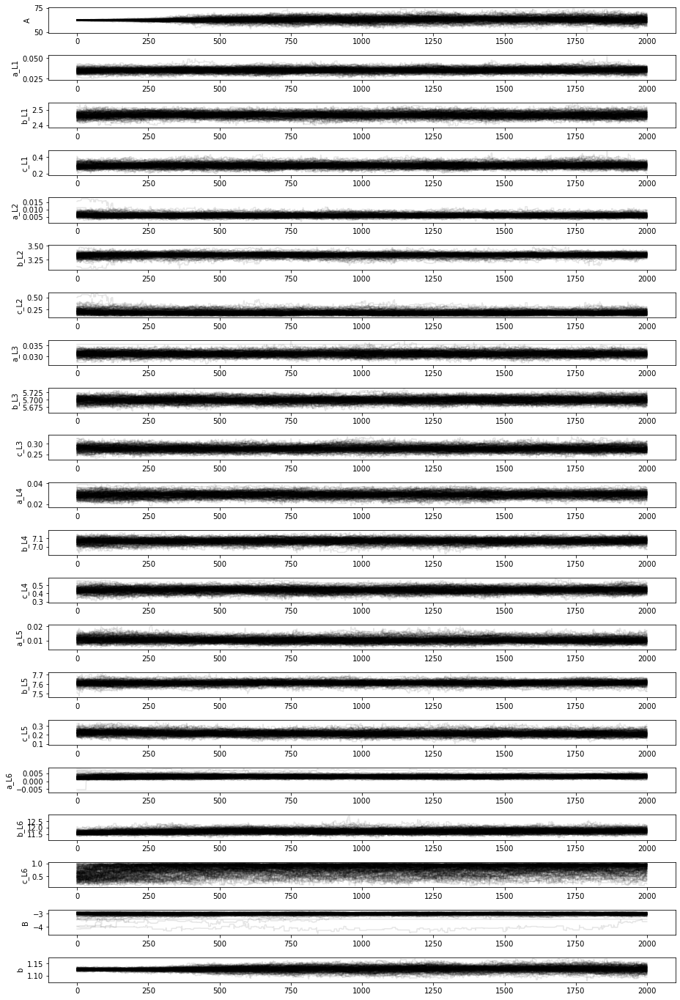

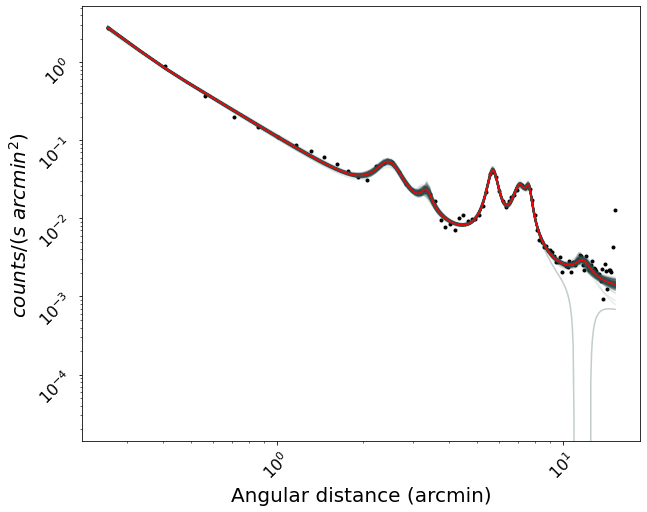

<Figure size 360x360 with 0 Axes>

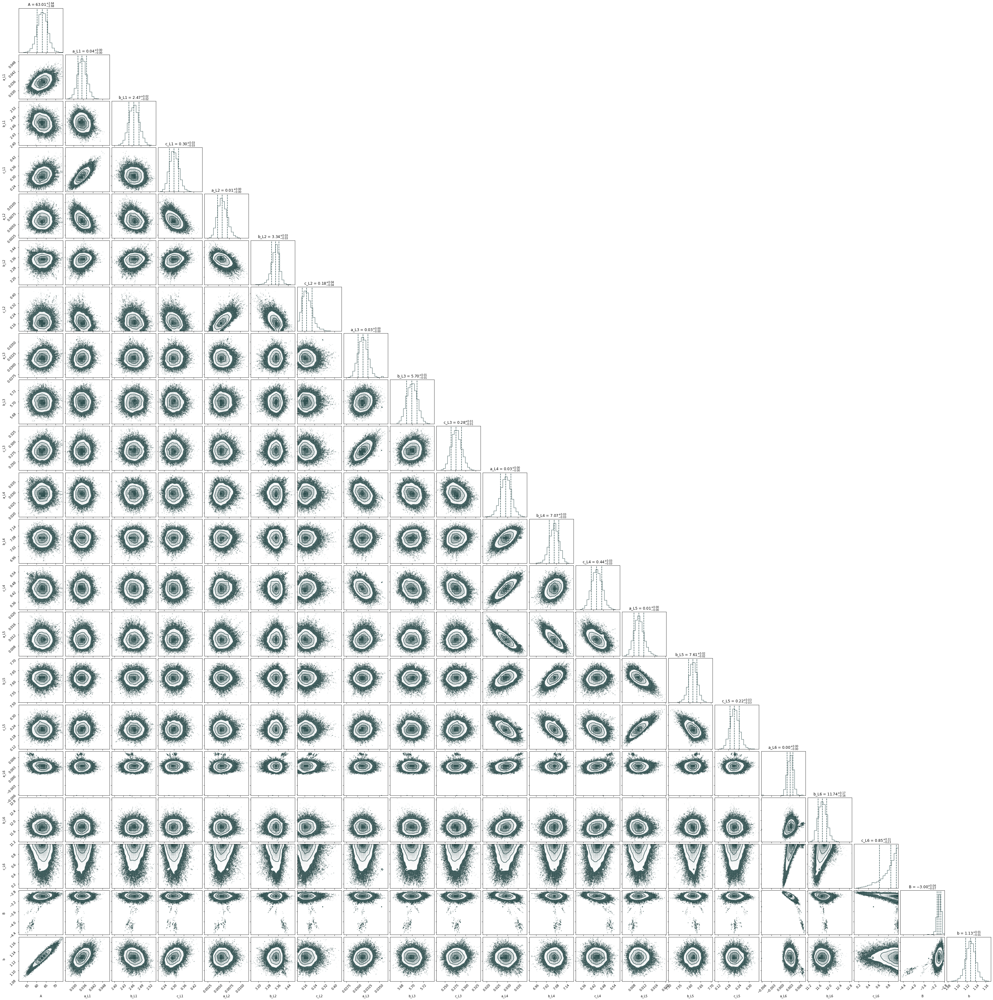

In [16]:
## PLOT OF WALKERS ##
plt.figure(figsize=(13,19))
# for each parameter...
for k in range(ndim):
    param_name = params_names[k]
    plt.subplot(ndim, 1, k + 1)
    # ...plot all chains
    for j in range(nwalkers):
        chain = sampler.chain[j, :, k]
        plt.plot(chain, "k", alpha=0.1)
    plt.ylabel(param_name)
plt.tight_layout()
plt.show()
## ## ## ## ## ## ## ## ## ## ## 

## PLOT THE DATA AND OPTIMAL MODEL ##
plt.figure(figsize=(10,8))
s_flag = 20 

plt.xlabel("Angular distance (arcmin)",fontsize=s_flag)
plt.ylabel("$counts/(s~arcmin^2)$",fontsize=s_flag)
plt.xticks(fontsize=s_flag-4, rotation=45)
plt.yticks(fontsize=s_flag-4, rotation=45)
    
plt.loglog(t, y, "k.")
# The positions where the prediction should be computed.
x = np.linspace(min(t), max(t), 200)

for s in samples[np.random.randint(len(samples), size=200)]:
    plt.plot(x,model1(s, x), color="darkslategray", alpha=0.1)

plt.plot(x, model1(optimal_parameters, x), "r-")
    
## ## ## ## ## ## ## ## ## ## ##

percentage_to_plot = 1.0

## PLOT THE CORNERPLOT ##
plt.figure(figsize=(5,5))
fig = corner.corner(flat_converged_chain,
                    quantiles=[0.16, 0.5, 0.84], 
                    labels=params_names, 
                    show_titles=True,
                    range=[percentage_to_plot] * ndim,
                    color="darkslategray")

# plt.savefig("cornerplot_dataset-1.png",dpi=50,bbox_inches='tight')
################################

# Creating histograms from XRT snapshots

Analyzing image: split_evt/sw005_1.evt
Analyzing image: split_evt/sw006_1.evt
Analyzing image: split_evt/sw006_2.evt
Analyzing image: split_evt/sw006_3.evt
Analyzing image: split_evt/sw006_4.evt
Analyzing image: split_evt/sw008_1.evt
Analyzing image: split_evt/sw008_2.evt
Analyzing image: split_evt/sw008_3.evt
Analyzing image: split_evt/sw009_1.evt


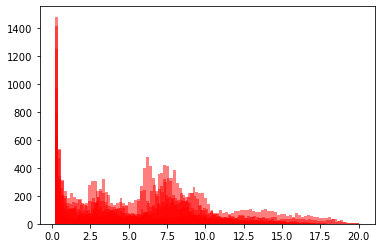

In [17]:
x_fin_temp = [x_fin]
y_fin_temp = [y_fin]
y_err_temp = [y_err_fin]

for iobs in range(1, len(file_names)): 
    file = 'data/' + file_names[iobs]+'.evt'
    file_sky = 'data/' + file_names[iobs]+'_ex.img'
    file_ex = 'data/' + file_names[iobs]+'_ex.img'
    
    x_fin_temp, y_fin_temp, y_err_temp, fit_fin_temp, pks_fin_temp = profiler.ring_builder(file_names[iobs], file, file_sky, file_ex)
   
    x_fin.append(*x_fin_temp)
    y_fin.append(*y_fin_temp)
    y_err_fin.append(*y_err_temp)   

# Running MCMC for XRT snapshots

Running burn-in...
Running production...


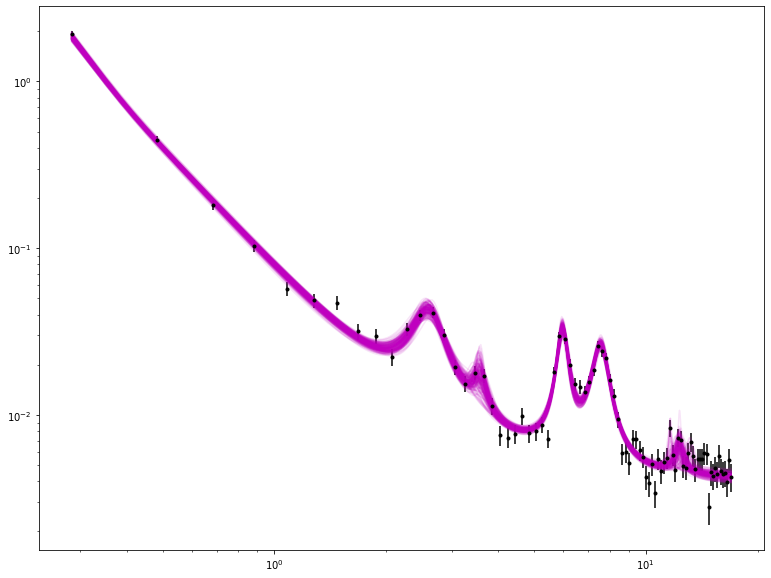

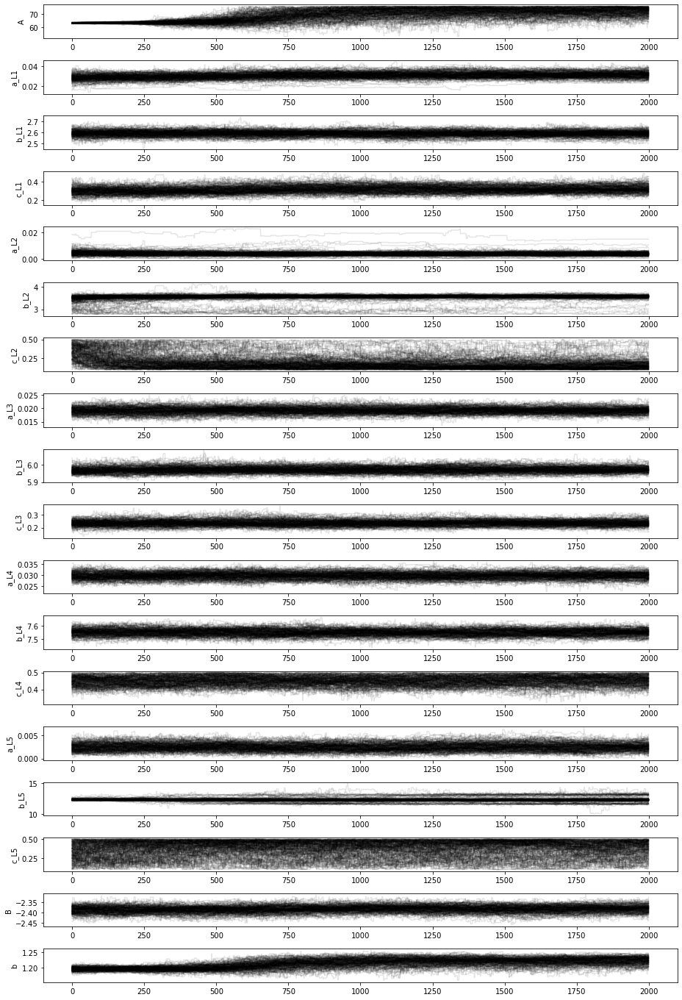

A = 71.3096
a_L1 = 0.0313662
b_L1 = 2.5895
c_L1 = 0.319541
a_L2 = 0.00377645
b_L2 = 3.56894
c_L2 = 0.158821
a_L3 = 0.0192065
b_L3 = 5.97146
c_L3 = 0.235445
a_L4 = 0.0298125
b_L4 = 7.55113
c_L4 = 0.451897
a_L5 = 0.00247894
b_L5 = 12.307
c_L5 = 0.401339
B = -2.38136
b = 1.22129
2/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

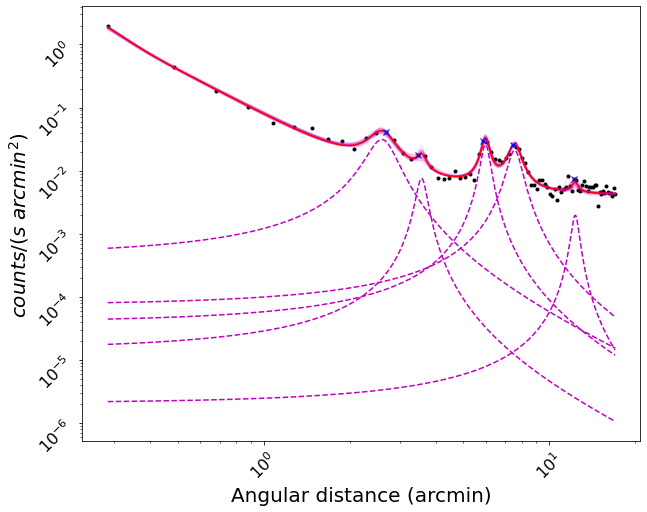

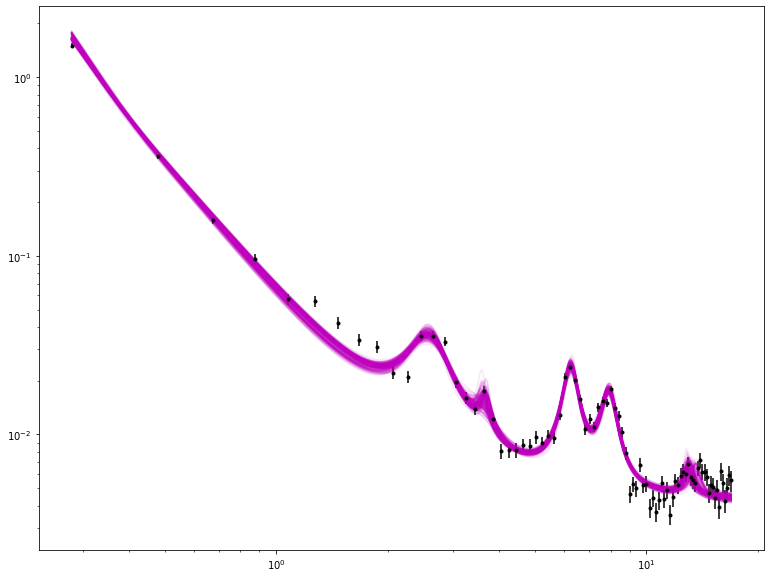

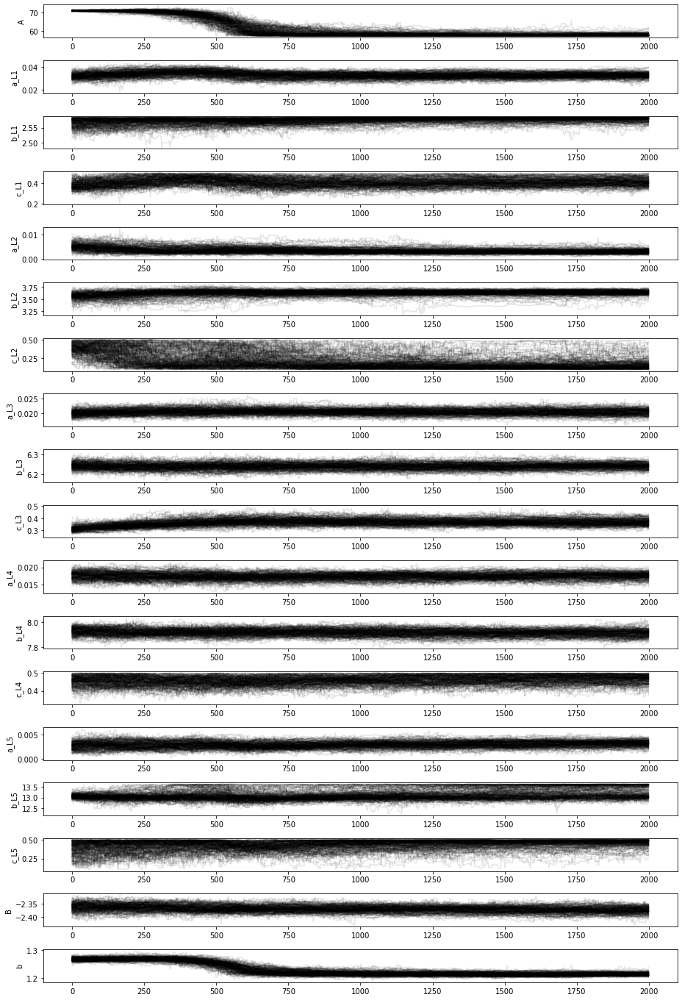

A = 57.6448
a_L1 = 0.0323953
b_L1 = 2.57829
c_L1 = 0.40427
a_L2 = 0.00299137
b_L2 = 3.64652
c_L2 = 0.152394
a_L3 = 0.0205281
b_L3 = 6.2408
c_L3 = 0.368991
a_L4 = 0.0174845
b_L4 = 7.91528
c_L4 = 0.46352
a_L5 = 0.00301888
b_L5 = 13.0817
c_L5 = 0.457429
B = -2.37238
b = 1.21378
3/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

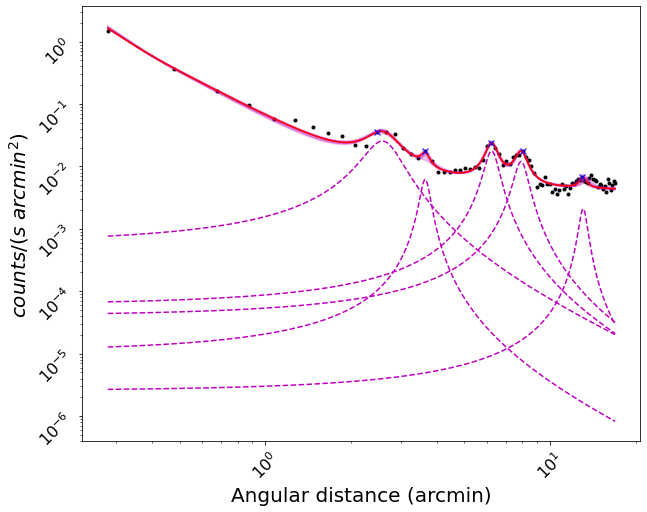

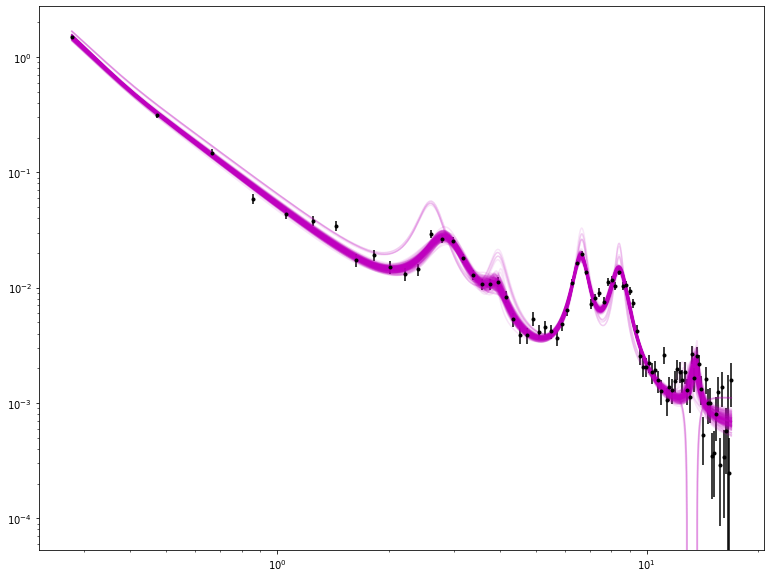

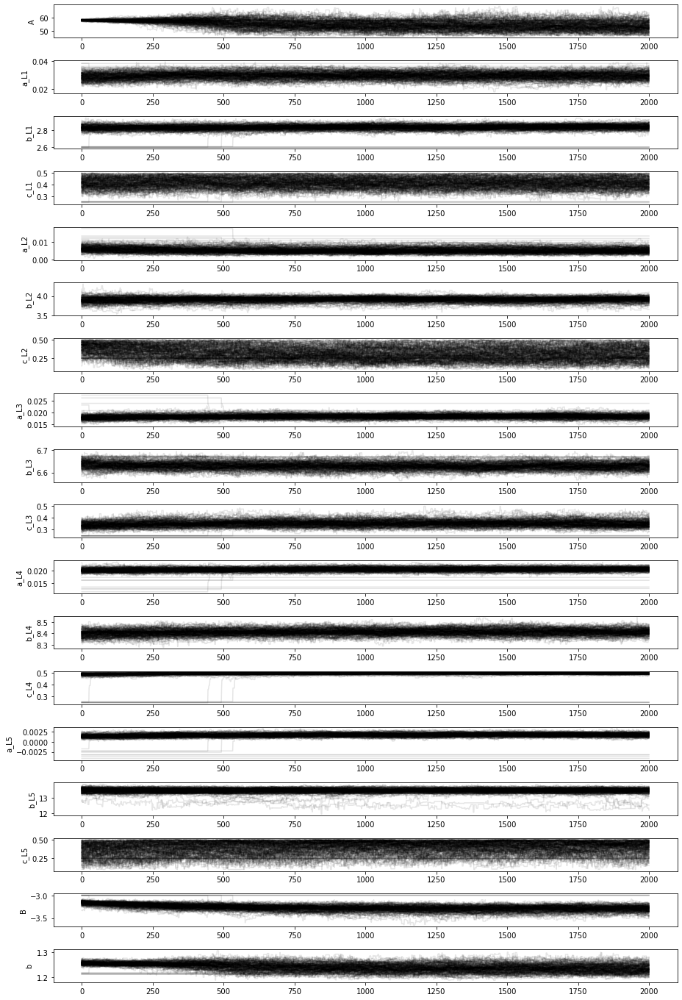

A = 53.8955
a_L1 = 0.0297054
b_L1 = 2.83886
c_L1 = 0.411499
a_L2 = 0.00507543
b_L2 = 3.91312
c_L2 = 0.293806
a_L3 = 0.018341
b_L3 = 6.62877
c_L3 = 0.35186
a_L4 = 0.0205782
b_L4 = 8.41386
c_L4 = 0.496517
a_L5 = 0.00175065
b_L5 = 13.4643
c_L5 = 0.415254
B = -3.28573
b = 1.23501
4/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

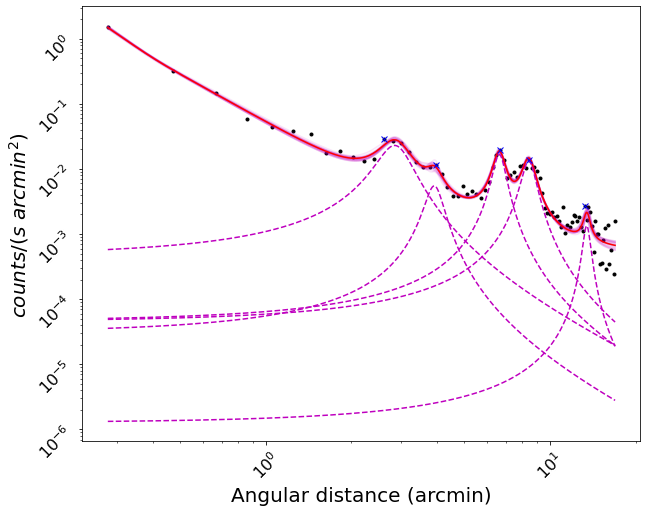

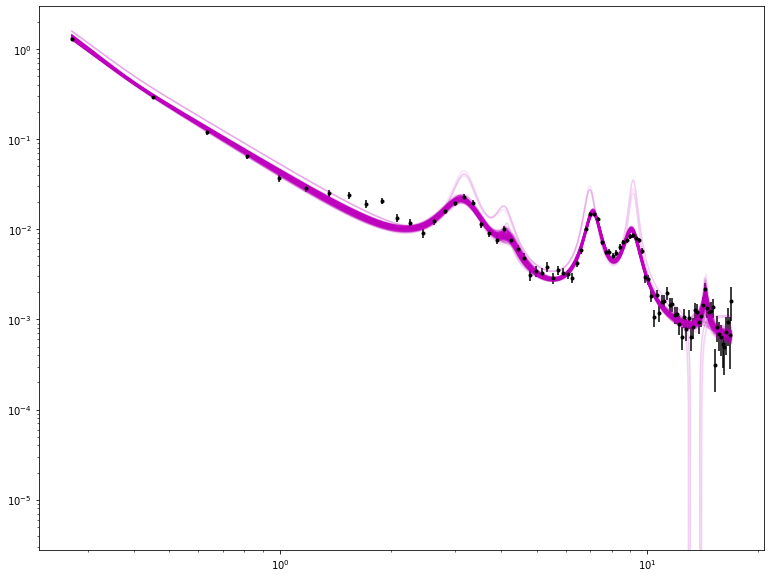

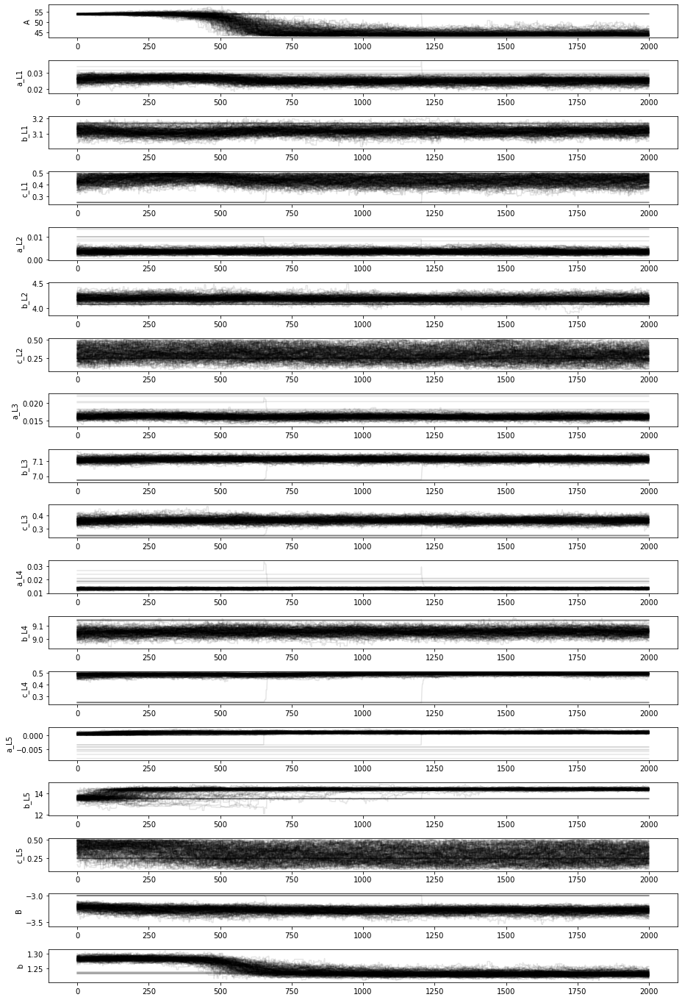

A = 44.1429
a_L1 = 0.025063
b_L1 = 3.11847
c_L1 = 0.435873
a_L2 = 0.00354445
b_L2 = 4.1772
c_L2 = 0.288186
a_L3 = 0.0160543
b_L3 = 7.11222
c_L3 = 0.363071
a_L4 = 0.0133601
b_L4 = 9.05854
c_L4 = 0.493469
a_L5 = 0.000945214
b_L5 = 14.3949
c_L5 = 0.287004
B = -3.2732
b = 1.23335
5/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

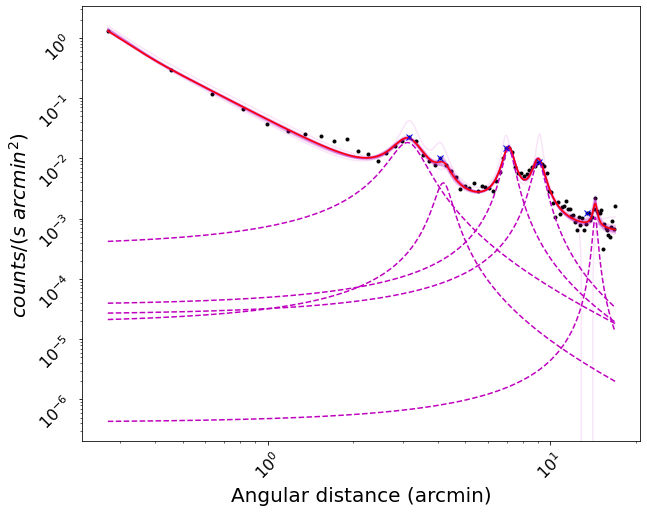

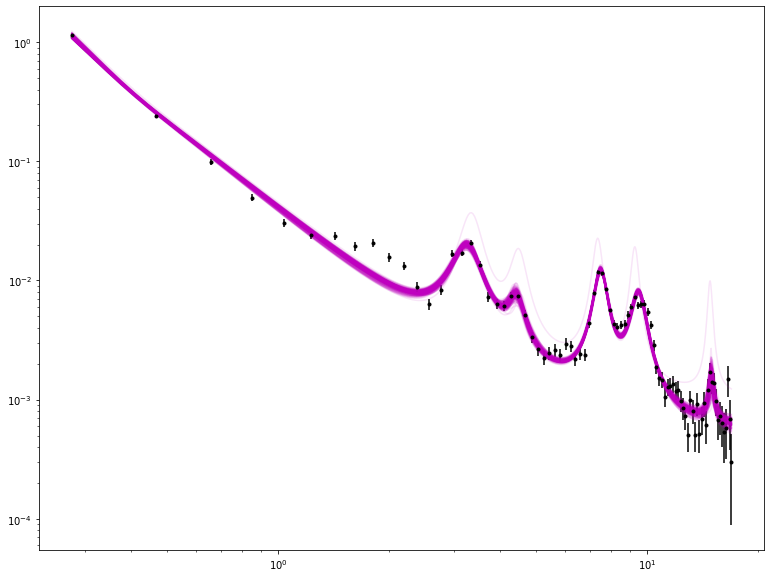

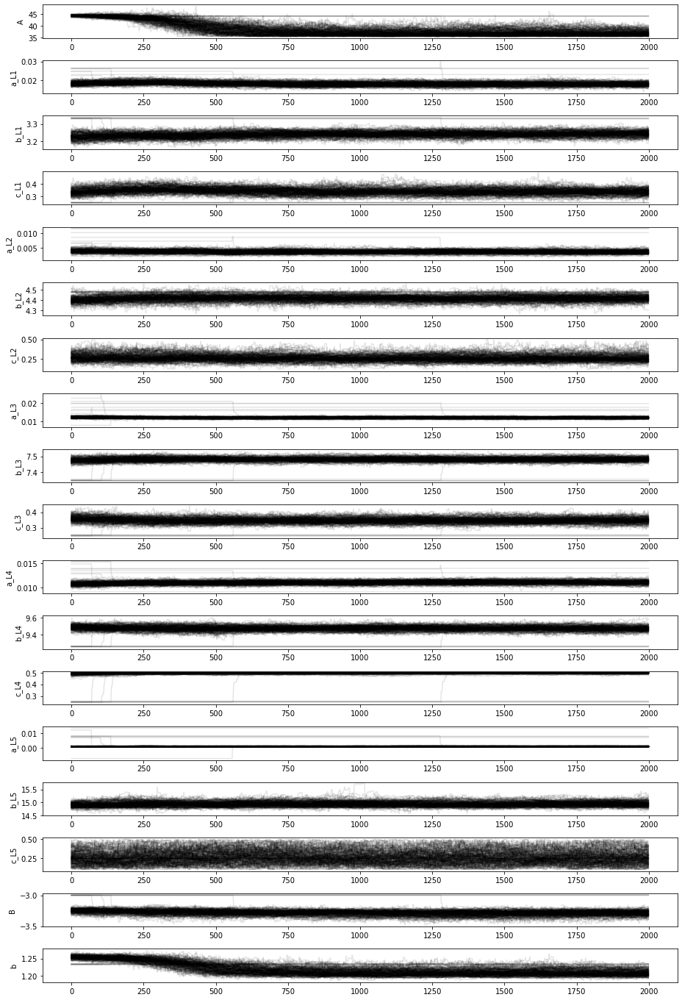

A = 36.7929
a_L1 = 0.0180343
b_L1 = 3.24232
c_L1 = 0.335173
a_L2 = 0.00377015
b_L2 = 4.41714
c_L2 = 0.251976
a_L3 = 0.0118918
b_L3 = 7.48046
c_L3 = 0.346164
a_L4 = 0.0110716
b_L4 = 9.47083
c_L4 = 0.497282
a_L5 = 0.000731778
b_L5 = 14.927
c_L5 = 0.249263
B = -3.28655
b = 1.20879
6/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

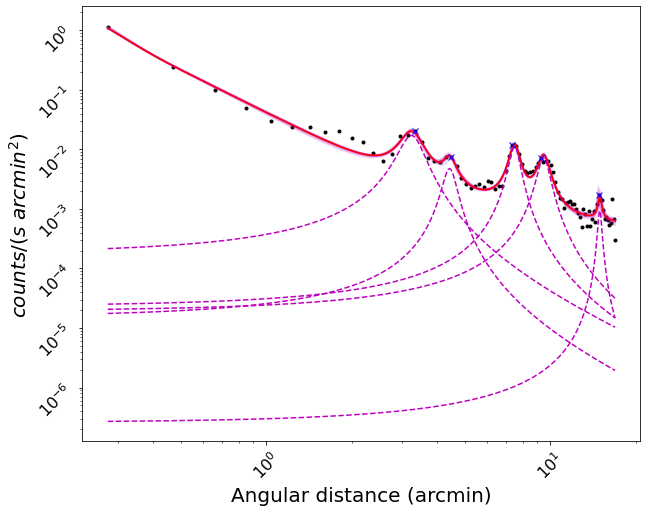

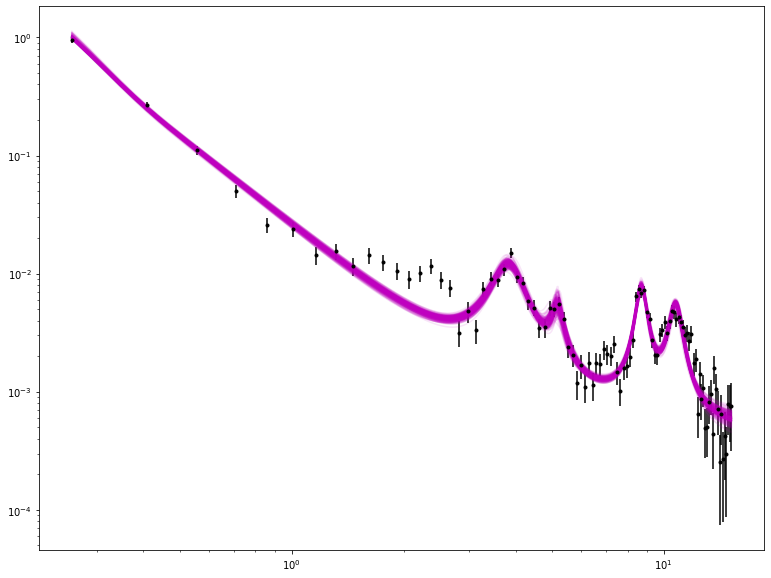

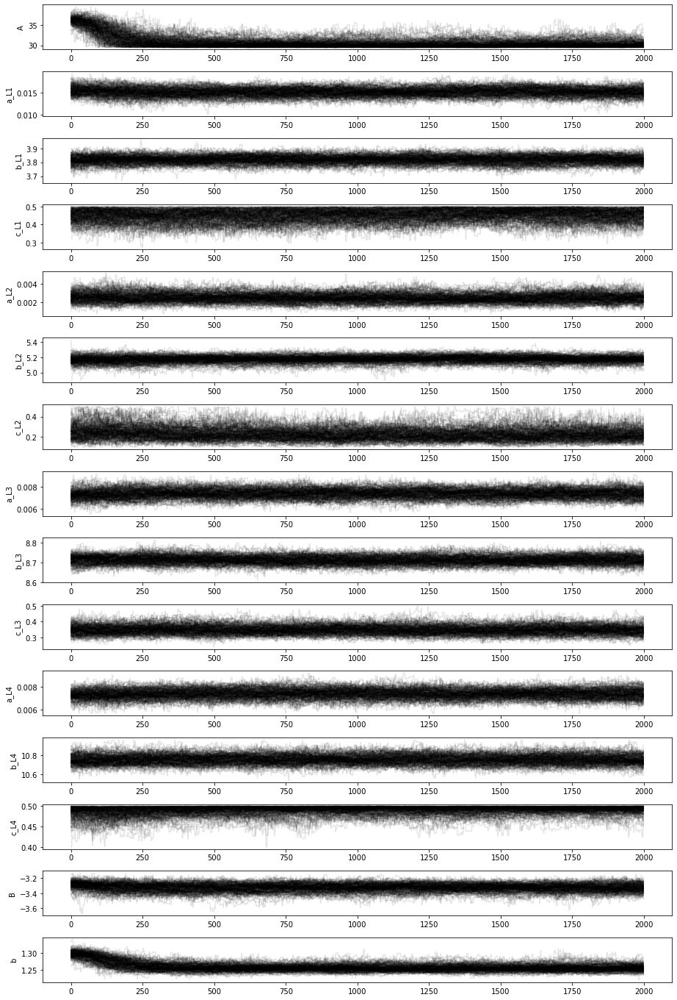

A = 30.0838
a_L1 = 0.0152067
b_L1 = 3.82018
c_L1 = 0.456732
a_L2 = 0.00245133
b_L2 = 5.1765
c_L2 = 0.217878
a_L3 = 0.00737299
b_L3 = 8.7124
c_L3 = 0.346878
a_L4 = 0.00741744
b_L4 = 10.7551
c_L4 = 0.493391
B = -3.32227
b = 1.25411
7/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

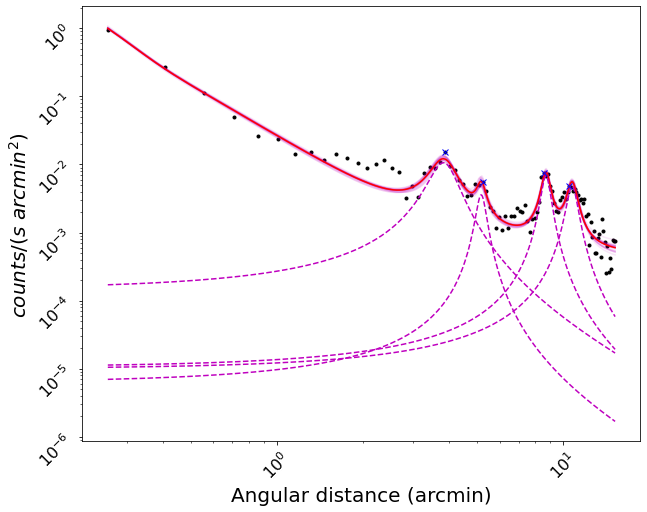

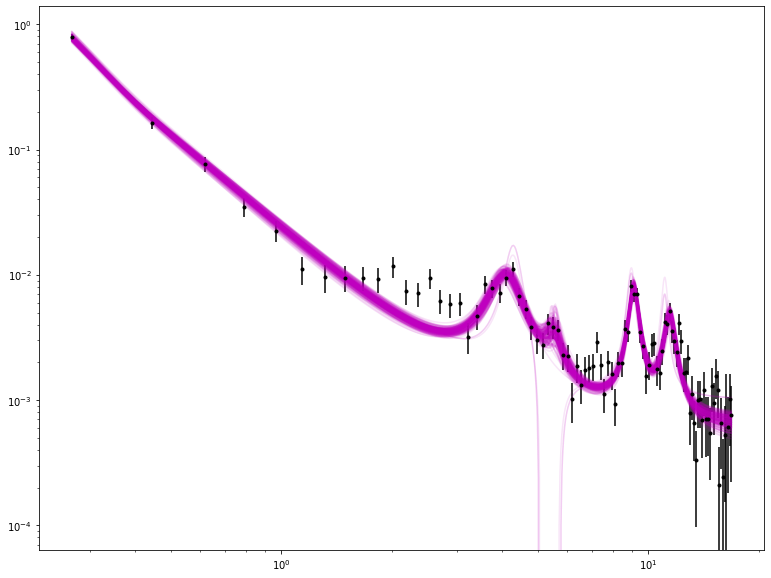

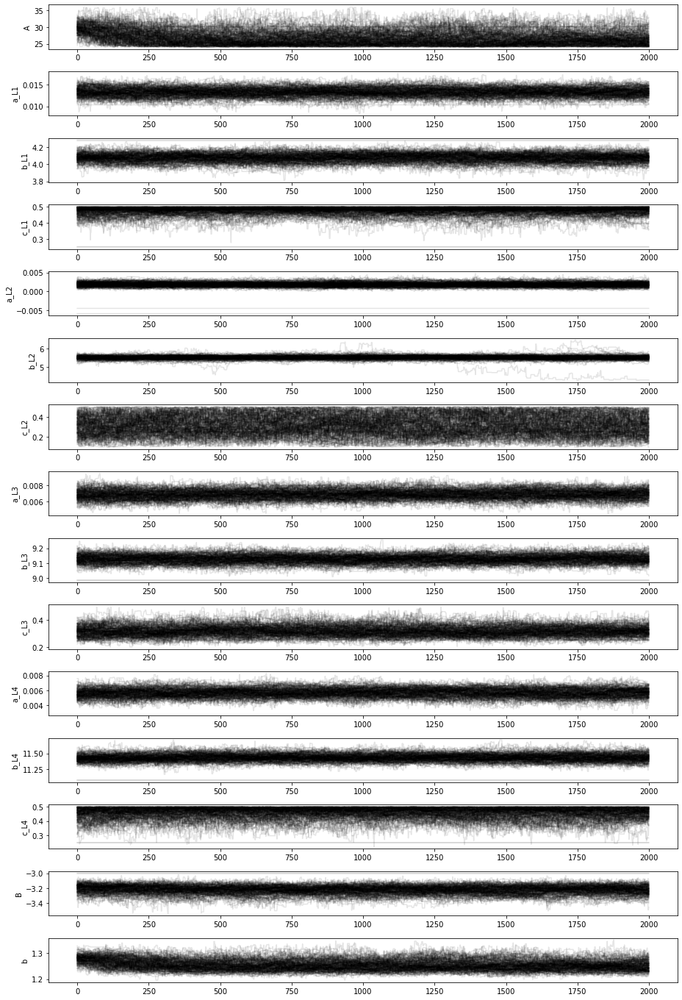

A = 26.1901
a_L1 = 0.0133307
b_L1 = 4.07924
c_L1 = 0.480641
a_L2 = 0.00180533
b_L2 = 5.52211
c_L2 = 0.311484
a_L3 = 0.00688348
b_L3 = 9.12796
c_L3 = 0.314546
a_L4 = 0.00571036
b_L4 = 11.432
c_L4 = 0.463291
B = -3.22105
b = 1.25027
8/10 done
Running burn-in...
Running production...


<Figure size 936x720 with 0 Axes>

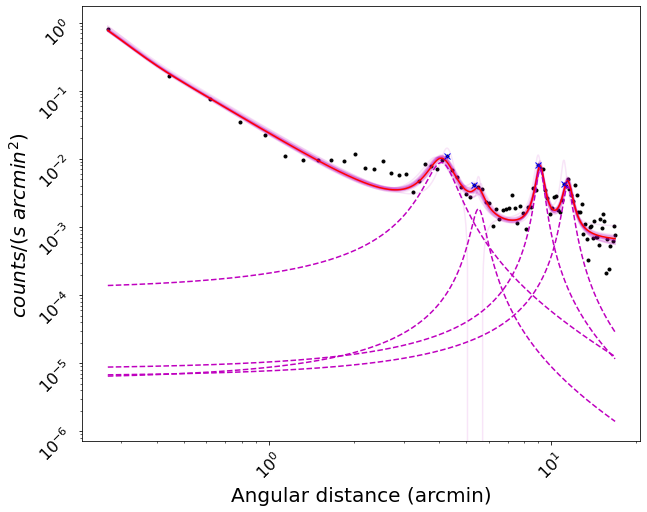

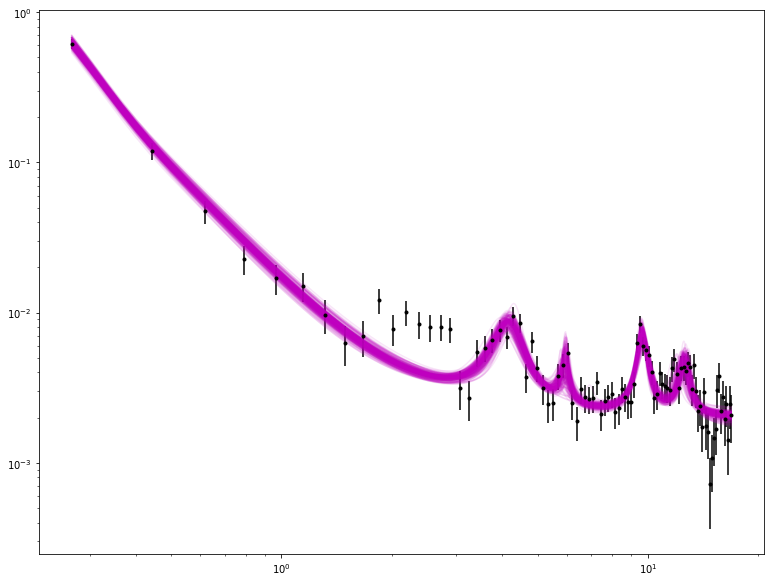

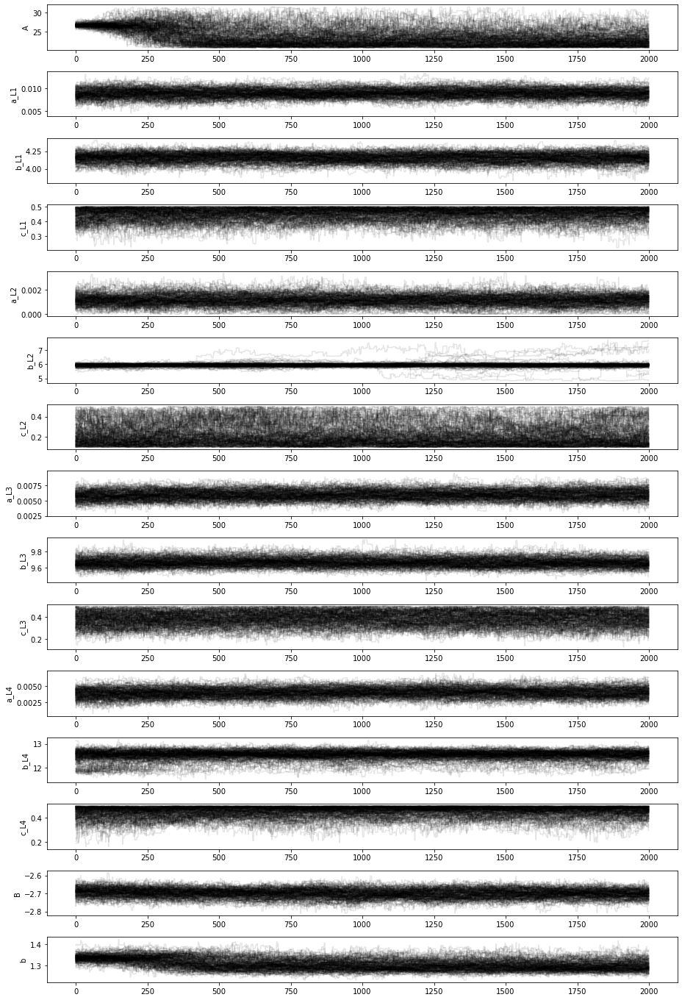

A = 22.6773
a_L1 = 0.00897307
b_L1 = 4.15699
c_L1 = 0.45805
a_L2 = 0.00114754
b_L2 = 5.94751
c_L2 = 0.181051
a_L3 = 0.0059514
b_L3 = 9.66225
c_L3 = 0.392039
a_L4 = 0.00406363
b_L4 = 12.5587
c_L4 = 0.465437
B = -2.70174
b = 1.296
9/10 done
Running burn-in...
Running production...


In [ ]:
params_fin=[params_fin[0]]
pks_fin=[pks_fin[0]]
samples_fin=[samples_fin[0]]

for i in range(1,len(time)):
    t = np.array(x_fin[i][0:])
    y = np.array(y_fin[i][0:])
    y_err2 = np.array(y_err_fin[i][0:])
    x_pk=[]

# Run peak finder for each XRT snapshot

    for j in range(0,len(pks_fin[i-1])): 
        check="Ring"
        if (i==1  and 3*j+1==13) or (i==4 and 3*j+1==16):
            pass
        else:
            low_d=5
            up_d=5
            mask=(t>1.)&(t>x_fin[i-1][pks_fin[i-1][j]-low_d])&(t<x_fin[i-1][pks_fin[i-1][j]+up_d])
            perc_down=0.8
            perc_up=1.2

            x_temp=t[mask]
            y_temp=y[mask]
            distan=len(x_temp) 
            pks=find_peaks(y_temp,height=0.,distance=distan)

            if len(pks[0])!=0:
                if len(x_pk)!=0:
                    dummy=x_temp[pks[0][0]] 
                    while dummy<=x_pk[-1] or dummy<=params_fin[i-1][3*j+2]:
                        low_d=low_d-1
                        up_d=up_d+1
                        perc_down+=0.05
                        perc_up+=0.05
                        if pks_fin[i-1][j]+up_d>=len(x_fin[i-1]):
                            check="Broken"
                            break
                        mask=(t>1.)&(t>x_fin[i-1][pks_fin[i-1][j]-low_d])&(t<x_fin[i-1][pks_fin[i-1][j]+up_d])
 
                        x_temp=t[mask]
                        y_temp=y[mask]
                        distan=len(x_temp)
            
                        pks=find_peaks(y_temp,height=0.,distance=distan)
 
                        if len(pks[0])==0:
                            dummy=x_pk[-1]
                        else:
                            dummy=x_temp[pks[0][0]]
                if check=="Ring":
                    x_pk.append(x_temp[pks[0][0]])

    pks=[np.where(t==x_pk[k])[0][0] for k in range(0,len(x_pk))]
    pks.sort()
    
    params_cor=[params_fin[i-1][0]]
    
    for j in range(0,len(pks)):
        params_cor.append(max(y[pks[j]],params_fin[i-1][3*j+1]))
        params_cor.append(t[pks[j]])
        params_cor.append(0.25) 
        
    params_cor.append(params_fin[0][-2])   
    params_cor.append(params_fin[i-1][-1])
    params_cor=np.array(params_cor)
    
    params_names = []
    count=1
    params_names=["A"]
    
    for k in range(1,len(params_cor)-2,3):
        params_names.append('a_L'+str(count))
        params_names.append('b_L'+str(count))
        params_names.append('c_L'+str(count))
        count += 1
    params_names.append("B")
    params_names.append("b")

    
    aL_min=[]
    aL_max=[]
    bL_min=[]
    bL_max=[]
    cL_min=[]
    cL_max=[]
    
   
    A_min=0.8*params_cor[0]
    A_max=1.2*params_cor[0]

    bg_min=-5.
    bg_max=-2.

    b_min=0.8*params_cor[-1]
    b_max=1.2*params_cor[-1]

    percentage_aL_min = 1. 
    percentage_aL_max = 1.  

    percentage_bL_min = 0.2 
    percentage_bL_max = 0.3 
    
    if i==2: percentage_bL_max = 0.05
        
    percentage_cL_min = 1.
    percentage_cL_max = 1.  

    for k in range(1,len(params_cor)-2,3):
        aL_min.append(params_cor[k]-percentage_aL_min*params_cor[k])
        aL_max.append(params_cor[k]+percentage_aL_max*params_cor[k])
        bL_min.append(params_cor[k+1]-percentage_bL_min*params_cor[k+1])
        bL_max.append(params_cor[k+1]+percentage_bL_max*params_cor[k+1]) 
        cL_min.append(0.1)
        cL_max.append(params_cor[k+2]+percentage_cL_max*params_cor[k+2])
        
       
    yerr = y_err2
    for k in range(0,len(y_err2)):
        if yerr[k] == 0. :
            yerr[k] = np.mean(yerr)

    data = (t, y, yerr)

    nwalkers = 200

    initial = np.array(params_cor.tolist())    
   
    ndim = len(initial)
    
    p0 = [np.array(initial) + 10**(-2.5) * np.random.randn(ndim)
          for k in range(nwalkers)]
    
    if flag_chain == 'y':
# Set up the backend
# Don't forget to clear it in case the file already exists
        filename = file_names[i]+"_chain.h5"
        backend = emcee.backends.HDFBackend(filename)
        backend.reset(nwalkers, ndim)
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob1, args=data, backend=backend)
    else:    
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob1, args=data)
        
    print("Running burn-in...")
    p0, _, _ = sampler.run_mcmc(p0, 500)
    sampler.reset()

    print("Running production...")
    sampler.run_mcmc(p0, 2000)
    
### ### ### START DIAGNOSTIC PLOTS ### ### ### 
    plt.figure(figsize=(13,10))
    # Plot the data.
    plt.errorbar(t, y, yerr=yerr, fmt=".k", capsize=0)

    # The positions where the prediction should be computed.
    x = np.linspace(min(t),max(t), 500)

    # Plot 24 posterior samples.
    samples = sampler.flatchain
    for s in samples[np.random.randint(len(samples), size=200)]:
        plt.loglog(x, model1(s, x), color="m", alpha=0.1)

## ## ## PLOT OF WALKERS ##   
    plt.figure(figsize=(13,19))
    # for each parameter...
    for k in range(ndim):
        param_name = params_names[k]
        plt.subplot(ndim, 1, k + 1)
        # ...plot all chains
        for j in range(nwalkers):
            chain = sampler.chain[j, :, k]
            plt.plot(chain, "k", alpha=0.1)
        plt.ylabel(param_name)
    plt.tight_layout()
    plt.show()
## ## ## ## ## ## ## ## ## ## 

    plt.figure(figsize=(13,10))

    n_burnin = 750

    percentage_to_plot = 1.0

    converged_chain = sampler.chain[:, n_burnin:, :]
    flat_converged_chain = converged_chain.reshape(converged_chain.shape[0] * converged_chain.shape[1], -1)

    optimal_parameters = []

    for dim in range(ndim):
        converged_values = sampler.chain[:, n_burnin:, dim].flatten()
        optimal_value = np.median(converged_values)
        print("{} = {:.6g}".format(params_names[dim], optimal_value))
        optimal_parameters.append(optimal_value)  

## PLOT THE DATA AND OPTIMAL MODEL ##
    plt.figure(figsize=(10,8))
    s_flag = 20 
    plt.xlabel("Angular distance (arcmin)",fontsize=s_flag)
    plt.ylabel("$counts/(s~arcmin^2)$",fontsize=s_flag)
    plt.xticks(fontsize=s_flag-4, rotation=45)
    plt.yticks(fontsize=s_flag-4, rotation=45)
    
    plt.plot(t, y, "k.")
    
    x = np.linspace(min(t), max(t), 500)
    for s in samples[np.random.randint(len(samples), size=25)]:
        plt.loglog(x,model1(s, x), color="m", alpha=0.1) 

    plt.plot(x,  model1(optimal_parameters, x), "r-")
    
    for j in range(1,len(optimal_parameters)-2,3):
        plt.plot(x,profiler.ring_profile(x,optimal_parameters[j],optimal_parameters[j+1],optimal_parameters[j+2]),'--m') 
    plt.plot(t[pks],y[pks],'xb')
    
### ### ### END DIAGNOSTIC PLOTS ### ### ### 
## ## ## ## ## ## ## ## ## ## ## ## ## ## ##

    params_fin.append(optimal_parameters)
    pks_fin.append(pks)
    
    quantiles=[0.16, 0.5, 0.84]  
    q=[]
    for j in range(0,len(params_fin[-1]),1):
        for k in range(0,len(quantiles)):
            q.append(np.quantile(flat_converged_chain[:,j], quantiles[k]))
    
    temp=[]
    for k in range(0,len(q),3):
        temp.append([abs(q[k+1]-q[k]),abs(q[k+1]-q[k+2])])
    
    fit_err.append(temp)

    samples_fin.append([samples])
    fgc.append([flat_converged_chain])
    
    
    
###   CREATING DATA FRAME WITH OPTIMAL PARAMETERS (df50) & ERRORS (df16, df84) ###
    q0=[]
    q1=[]
    q2=[]

    for j in range(0, len(params_fin[-1]),1):
        q0.append(np.quantile(flat_converged_chain[:,j], quantiles[1]))
        q1.append(np.quantile(flat_converged_chain[:,j], quantiles[0]))
        q2.append(np.quantile(flat_converged_chain[:,j], quantiles[2]))

    df50 = df50.append(pd.DataFrame([q0],columns=params_names), ignore_index = True)
    df16 = df16.append(pd.DataFrame([q1],columns=params_names), ignore_index = True)
    df84 = df84.append(pd.DataFrame([q2],columns=params_names), ignore_index = True)
    
    df50['MJD'][i] = '%.3f'%(time[i])
    df16['MJD'][i] = '%.3f'%(time[i])
    df84['MJD'][i] = '%.3f'%(time[i])
    print(str(i+1)+'/'+str(len(y_fin))+" done")

# Writing data frames to csv files 

In [13]:
df50.to_csv('optimal.csv')
df16.to_csv('err_lo.csv')
df84.to_csv('err_hi.csv')

In [ ]:
a_file = open("Data_params.txt", "w")
for i in range(0,len(params_fin)):
    a_file.write(f"{params_fin[i]}\n")
    a_file.write(f"{fit_err[i]}\n")
a_file.close()

# Plot of the angular profile fitting with MCMC

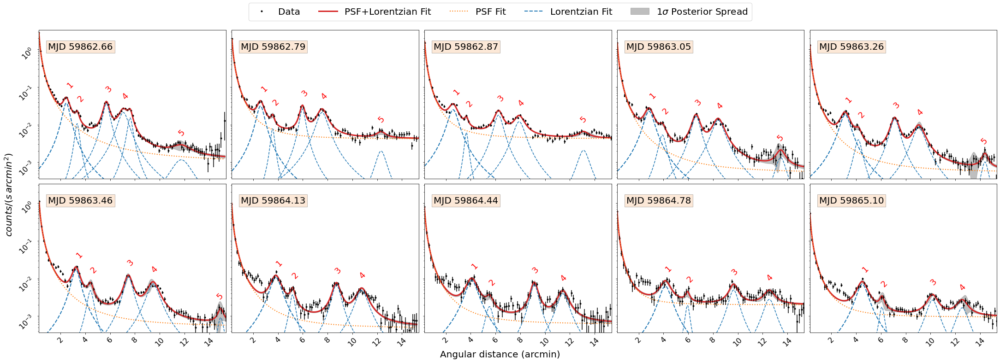

In [16]:
def sample_walkers(nsamples,flattened_chain):
    models = []
    draw = np.floor(np.random.uniform(0,len(flattened_chain),size=nsamples)).astype(int)
    thetas = flattened_chain[draw]    
    
    for i in thetas:
        mod = model1(i,x_model)
        models.append(mod)
        
    spread = np.std(models,axis=0)
    med_model = np.median(models,axis=0)
    return med_model,spread

##################################

poly_fit='PSF'        # Options: Poly or PSF
ring_fit="Lorentzian"  # Options: "Gauss" or "Lorentzian"

##################################

tot_fig,axes =plt.subplots(2, 5, sharex=True, sharey=True,constrained_layout=True, figsize=(30,10))
s_flag=20.
cmap = plt.cm.tab10

for i in range(0,len(time)):
    tot_fig.supxlabel("Angular distance (arcmin)",fontsize=s_flag)
    tot_fig.supylabel("$counts/(s \,  arcmin^2)$",fontsize=s_flag)
    tot_fig.add_subplot(2,5,i+1)
    
    t=x_fin[i]
    y=y_fin[i]
    xmin = min(t)
    xmax = max(t)
    
    x_model = np.linspace(xmin, xmax, 500)
    y_model = model1(params_fin[i], x_model)
    
    samp=np.array(*samples_fin[i])
    chain=np.array(*fgc[i])

    med_model, spread = sample_walkers(1000,chain)
    
    if i==0:
        ax1 = plt.subplot(251)
        mask=(np.array(y)>0.)
        plt.ylim([min(np.array(y)[mask])/2.5,1.2*max(y)])
        plt.xlim([xmin,xmax+0.1])
        plt.yscale('log')
        plt.plot(t, y, "k.",label='Data')   
        plt.plot(x_model, y_model, "-",color=cmap.colors[3],label=poly_fit+'+'+ring_fit+' Fit',lw = 3)
        plt.plot(x_model, profiler.poly(x_model,params_fin[i][0],params_fin[i][-2],params_fin[i][-1]),':',color=cmap.colors[1],label=poly_fit+' Fit',lw = 2)
        plt.plot(x_model, profiler.ring_profile(x_model,params_fin[i][1],params_fin[i][2],params_fin[i][3]),'--',color=cmap.colors[0],label=ring_fit+' Fit',lw = 2)
        plt.fill_between(x_model,med_model-1*spread,med_model+1*spread,color='grey',alpha=0.5,label=r'$1\sigma$ Posterior Spread')
    else:
        ax2=plt.subplot(2,5,i+1, sharex=ax1, sharey=ax1)
        plt.plot(t, y, "k.",label='__nolabel__') 
        plt.plot(x_model, y_model, "-",color=cmap.colors[3],label="__nolabel__",lw = 3)
        plt.plot(x_model, profiler.poly(x_model,params_fin[i][0],params_fin[i][-2],params_fin[i][-1]),':',color=cmap.colors[1],label="__nolabel__",lw = 2)
        plt.plot(x_model, profiler.ring_profile(x_model,params_fin[i][1],params_fin[i][2],params_fin[i][3]),'--',color=cmap.colors[0],label="__nolabel__",lw = 2) 
        plt.fill_between(x_model,med_model-1*spread,med_model+1*spread,color='grey',alpha=0.5,label="__nolabel__")
        
    for j in range(0,int((len(params_fin[i])-2)/3)):
        if i==0 and j==4:
            pass
        else:
            if i==0 and j>4:
                plt.text(0.97*params_fin[i][3*j+2],model1(params_fin[i], params_fin[i][3*j+2])*1.8,'%d'%(j),color="r",fontsize=s_flag-2, rotation= 45)
            else:
                plt.text(0.97*params_fin[i][3*j+2],model1(params_fin[i], params_fin[i][3*j+2])*1.8,'%d'%(j+1),color="r",fontsize=s_flag-2, rotation= 45)
            
    plt.errorbar(t, y, yerr=y_err_fin[i],color="k",fmt="none")
    
    for j in range(4,len(params_fin[i])-2,3):
        plt.plot(x_model,profiler.ring_profile(x_model,params_fin[i][j],params_fin[i][j+1],params_fin[i][j+2]),'--',color=cmap.colors[0],label='__nolabel__') 

    plt.xticks(fontsize=s_flag-4, rotation=45)
    plt.yticks(fontsize=s_flag-4, rotation=45)
    plt.text(1.,1.,'MJD %.2f'%(time[i]),fontsize=s_flag,bbox=dict(facecolor='sandybrown', alpha=0.25))
    
tot_fig.legend(fontsize=s_flag, loc="center",bbox_to_anchor=(+0.5,+1.05, 0. ,0.), ncol=5)
# plt.tight_layout()
# plt.savefig("Radial_Profiles.jpg",dpi=300,bbox_inches='tight')
plt.show()